In [1]:
import numpy as np
from time import sleep, time

In [2]:
import os

In [3]:
import tables

In [4]:
import pandas as pd

In [5]:
from scipy.interpolate import interp1d

In [6]:
from astropy.cosmology import FlatLambdaCDM, Planck18

In [7]:
import vrpy_tools

In [8]:
from gadget_tools import Snapshot, read_positions_all_files

In [9]:
from pm_tools import assign_density

In [10]:
# import yt
# import numpy as np
# import yt.units as units
# import pylab
import sphviewer
from sphviewer.tools import QuickView

In [11]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

In [12]:
# plt.style.use('dark_background')

In [13]:
plt.style.use('default')

In [14]:
L=150
N = 512
i=10
rund='r4'

In [15]:
siminfo = vrpy_tools.ReadSimInfo(f"/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18/{rund:s}/halos_vr_6d/out_{i:03d}")

In [16]:
config = vrpy_tools.ReadConfigInfo(f"/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18/{rund:s}/halos_vr_6d/out_{i:03d}")

In [17]:
# config

In [18]:
a = siminfo['ScaleFactor']
z = 1/a - 1
h = siminfo['h_val']
Om_m = siminfo['Omega_m']

In [19]:
p18py = Planck18

In [20]:
a**3

0.08944296180023635

In [21]:
mean_dens = config['Critical_density']

In [22]:
mean_dens_comov = mean_dens / h**2 * a**3

In [23]:
mean_dens_comov/1e10

8.499341058348392

In [24]:
vir_dens = config['Virial_density']*config['Critical_density']/p18py.Om(z)

In [25]:
# vir_dens *= h**2 / a**3; vir_dens

In [26]:
vir_dens/config['Virial_density']

526128842584.6038

In [27]:
# siminfo #desiredfields=['Mass_200mean', 'Mvir', 'Efrac', 'Ekin', 'Epot', 'ID'], 

In [28]:
hal_vr_dict, N_hal_tot_vr = vrpy_tools.ReadPropertyFile(f"/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18/{rund:s}/halos_vr_6d/out_{i:03d}", ibinary=2, isiminfo=False, iunitinfo=False, iconfiginfo=False)
hal_vr_all = pd.DataFrame.from_dict(hal_vr_dict)
hal_vr_all.set_index('ID', inplace=True)
hal_vr_all = hal_vr_all.loc[hal_vr_all.hostHaloID==-1]
hal_vr_all['kin_rat'] = 2*hal_vr_all.Ekin/np.abs(hal_vr_all.Epot)

In [29]:
hal_rs_all = pd.read_csv(os.path.join(f'/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18/{rund:s}/halos_rs/out_wp_{i:d}.list'), sep=r'\s+', header=0, skiprows=list(range(1,16)), engine='c')
hal_rs_all.set_index('#ID', inplace=True)
hal_rs_all = hal_rs_all.loc[hal_rs_all.PID==-1]
hal_rs_all['kin_rat'] = 2*hal_rs_all['T/|U|']

In [30]:
hal_vr = hal_vr_all.loc[hal_vr_all.kin_rat.between(0.5,1.7)]
hal_rs = hal_rs_all.loc[hal_rs_all.kin_rat.between(0.5,1.7)]

In [31]:
hal_vr_all

,Efrac,Ekin,Epot,ID_mbp,ID_minpot,Krot,Lx,Lx_200crit,Lx_200crit_excl,Lx_200mean,...,veldisp_xx,veldisp_xy,veldisp_xz,veldisp_yx,veldisp_yy,veldisp_yz,veldisp_zx,veldisp_zy,veldisp_zz,kin_rat
ID,,,,,,,,,,,,,,,,,,,,,
1,0.959808,8.165355e+18,-1.196363e+19,29125241,29387390,0.362938,-1.349956e+15,-1.654990e+15,-1.319326e+15,-1.770862e+15,...,143806.774481,-1628.618597,-22866.783525,-1628.618597,191063.511284,24700.379680,-22866.783525,24700.379680,162024.899575,1.365030
2,0.903355,4.338974e+18,-5.104476e+18,1364014,1625132,0.363163,-8.636494e+13,-1.445966e+14,-8.098284e+13,-1.530169e+14,...,146623.935312,35566.820058,8949.396949,35566.820058,163417.077475,22901.001209,8949.396949,22901.001209,129681.363679,1.700066
3,0.951424,2.877708e+18,-4.424939e+18,31247383,30983700,0.329208,3.832331e+13,1.166440e+14,4.207973e+13,1.502214e+14,...,98516.467219,17650.086569,641.887032,17650.086569,138860.015414,10953.297169,641.887032,10953.297169,81622.161043,1.300677
4,0.968691,3.010459e+18,-4.254503e+18,28350984,27830283,0.256887,-7.578373e+13,-5.543397e+13,-7.095954e+13,-5.760216e+13,...,105358.911948,-1797.986432,5673.284500,-1797.986432,161150.834548,7522.595191,5673.284500,7522.595191,91541.752209,1.415187
5,0.850052,1.950315e+18,-2.282447e+18,5039157,5041711,0.369250,4.470135e+13,1.380658e+14,4.008049e+13,1.286497e+14,...,159721.874977,-1629.539645,-11933.972404,-1629.539645,84612.298453,-4296.218115,-11933.972404,-4296.218115,78886.113593,1.708968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192332,1.000000,1.613363e+14,-2.896098e+14,118178279,118440422,0.268212,3.343692e+09,-2.404508e+09,3.343692e+09,-2.404508e+09,...,1702.303524,389.982958,-291.676551,389.982958,1415.730820,-44.296790,-291.676551,-44.296790,1999.585504,1.114163
192333,1.000000,1.376608e+14,-2.179418e+14,124205577,123942411,0.391924,1.180218e+09,2.419721e+10,2.299254e+10,1.277834e+10,...,1821.511392,45.583641,564.588442,45.583641,998.727247,353.510721,564.588442,353.510721,1546.388571,1.263280
192334,1.000000,2.058459e+14,-3.289766e+14,128650140,129698203,0.344242,-8.149472e+09,-1.249614e+10,-1.292695e+10,-3.029440e+09,...,1245.586076,348.910984,-39.231671,348.910984,1791.018120,205.232524,-39.231671,205.232524,3492.866786,1.251432


In [32]:
hal_rs_sel = hal_rs.loc[hal_rs.Mvir>1e13].sort_values('Mvir')

In [33]:
hal_vr_sel = hal_vr.loc[hal_vr.Mass_BN98>1e13].sort_values('Mass_BN98')

In [34]:
# hal_rs_sel.sort_values('X')

In [42]:
# hal_vr_sel.Mass_BN98

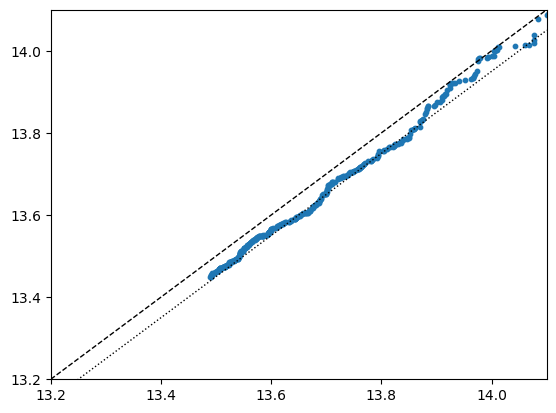

In [43]:
plt.scatter(np.log10(hal_rs_sel.Mvir.iloc[-400:]), np.log10(hal_vr_sel.Mass_BN98.iloc[-400:]), s=10)
plt.xlim(13.2,14.1)
plt.ylim(13.2,14.1)
plt.plot(np.linspace(13.2,14.1,10),np.linspace(13.2,14.1,10),'k--', lw=1)
plt.plot(np.linspace(13.2,14.1,10),np.linspace(13.2,14.1,10)-0.05,'k:', lw=1)

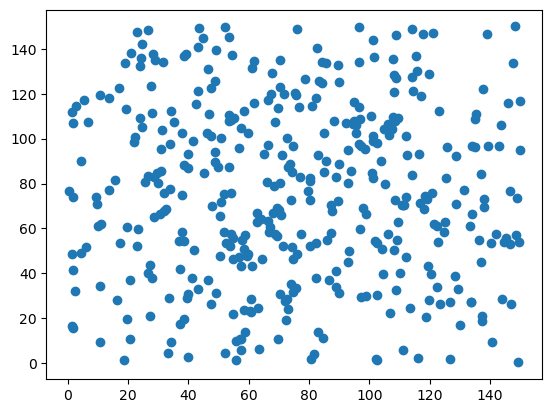

In [37]:
plt.scatter(hal_rs_sel.X.iloc[-400:], hal_vr_sel.Xc.iloc[-400:])

<function matplotlib.pyplot.scatter(x, y, s=None, c=None, marker=None, cmap=None, norm=None, vmin=None, vmax=None, alpha=None, linewidths=None, verts=<deprecated parameter>, edgecolors=None, *, plotnonfinite=False, data=None, **kwargs)>

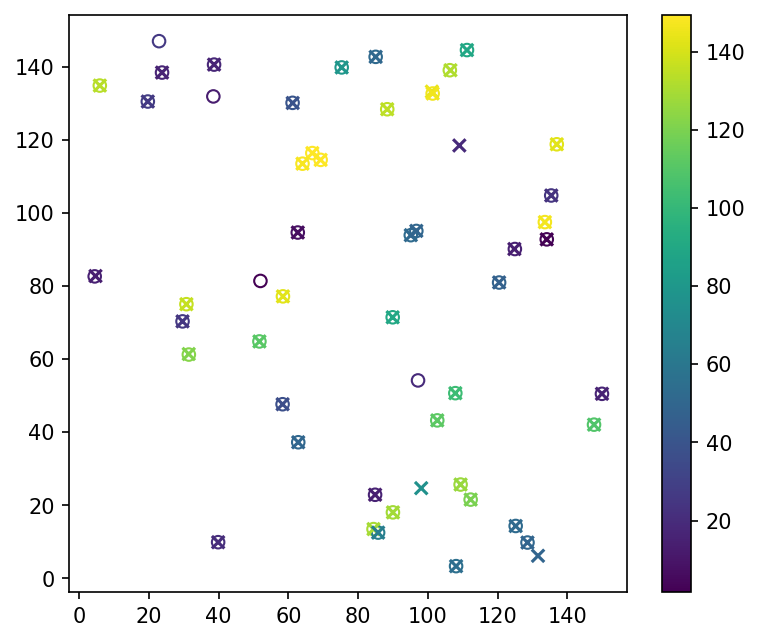

In [38]:
plt.figure(dpi=150, figsize=(5*1.2,5))
g = plt.scatter(hal_rs_sel.X[-50:], hal_rs_sel.Y[-50:], c=hal_rs_sel.Z[-50:], marker='o')
plt.scatter(hal_vr_sel.Xcmbp[-50:], hal_vr_sel.Ycmbp[-50:], c=hal_vr_sel.Zcmbp[-50:], marker='x')
g.set_facecolor('none')
plt.colorbar()
plt.scatter

In [39]:
hal_rs_sel.kin_rat.mean()

1.3736460694698354

In [40]:
hal_vr_sel.kin_rat.mean()

1.4432305257154523

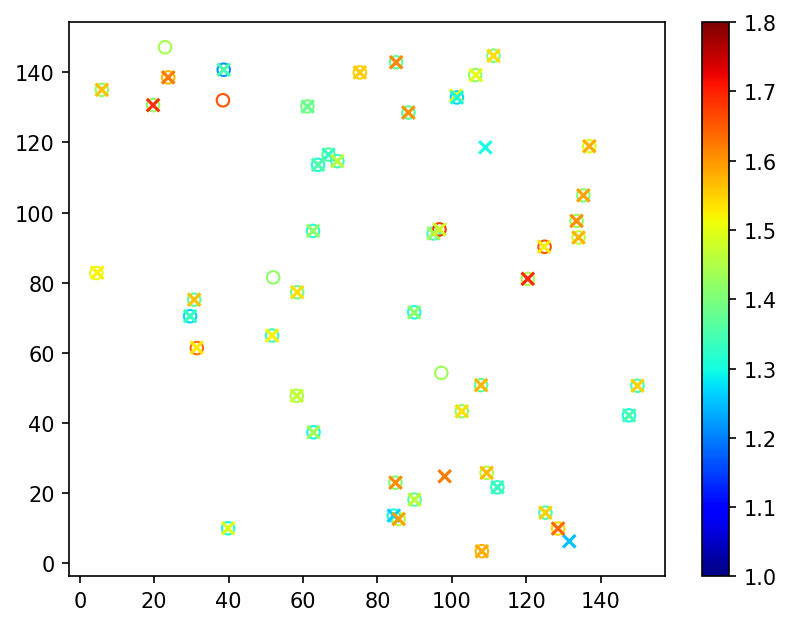

In [41]:
plt.figure(dpi=150, )
g = plt.scatter(hal_rs_sel.X[-50:], hal_rs_sel.Y[-50:], c=hal_rs_sel.kin_rat[-50:], marker='o', cmap='jet', vmin=1,vmax=1.8)
plt.scatter(hal_vr_sel.Xcmbp[-50:], hal_vr_sel.Ycmbp[-50:], c=hal_vr_sel.kin_rat[-50:], marker='x', cmap='jet', vmin=1,vmax=1.8)
g.set_facecolor('none')
plt.colorbar()

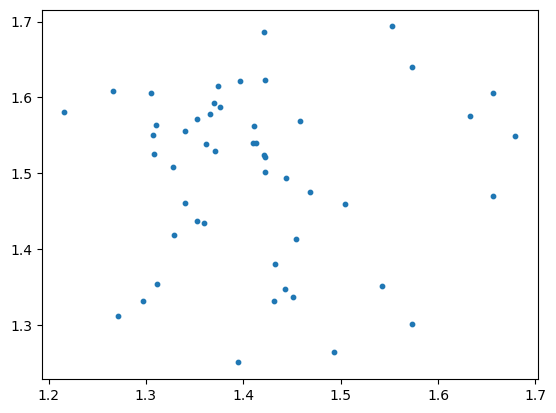

In [42]:
plt.scatter(hal_rs_sel.kin_rat.iloc[-50:], hal_vr_sel.kin_rat.iloc[-50:], s=10)
# plt.xlim(13.2,14.1)
# plt.ylim(13.2,14.1)
# plt.plot(np.linspace(13.2,14.1,10),np.linspace(13.2,14.1,10),'k--', lw=1)
# plt.plot(np.linspace(13.2,14.1,10),np.linspace(13.2,14.1,10)-0.05,'k:', lw=1)

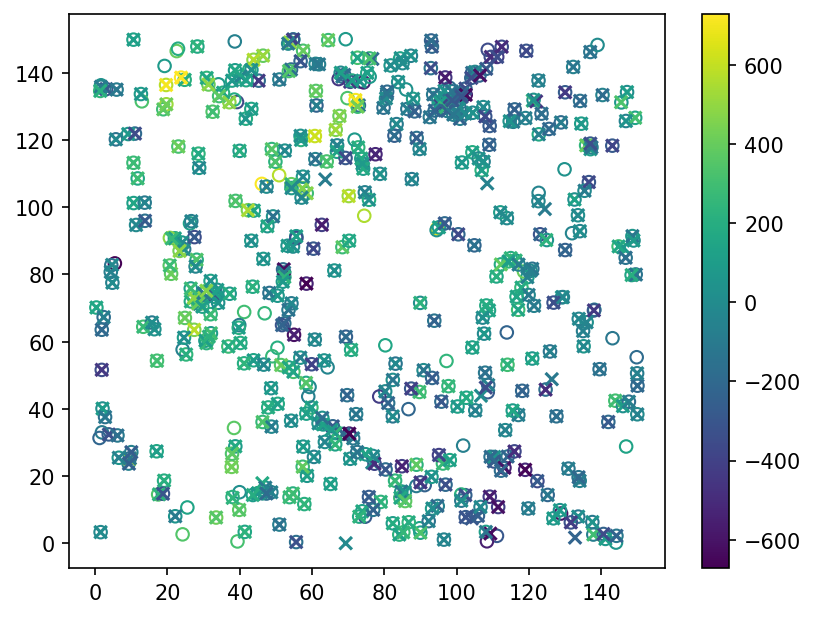

In [80]:
plt.figure(dpi=150)
g = plt.scatter(hal_rs_sel.X, hal_rs_sel.Y, c=hal_rs_sel.VX, marker='o')
plt.scatter(hal_vr_sel.Xcmbp, hal_vr_sel.Ycmbp, c=hal_vr_sel.VXcmbp, marker='x')
g.set_facecolor('none')
plt.colorbar()

In [81]:
hal_vr_dict.keys()

dict_keys(['Efrac', 'Ekin', 'Epot', 'ID', 'ID_mbp', 'ID_minpot', 'Krot', 'Lx', 'Lx_200crit', 'Lx_200crit_excl', 'Lx_200mean', 'Lx_200mean_excl', 'Lx_BN98', 'Lx_BN98_excl', 'Ly', 'Ly_200crit', 'Ly_200crit_excl', 'Ly_200mean', 'Ly_200mean_excl', 'Ly_BN98', 'Ly_BN98_excl', 'Lz', 'Lz_200crit', 'Lz_200crit_excl', 'Lz_200mean', 'Lz_200mean_excl', 'Lz_BN98', 'Lz_BN98_excl', 'Mass_200crit', 'Mass_200crit_excl', 'Mass_200mean', 'Mass_200mean_excl', 'Mass_BN98', 'Mass_BN98_excl', 'Mass_FOF', 'Mass_tot', 'Mvir', 'RVmax_Lx', 'RVmax_Ly', 'RVmax_Lz', 'RVmax_eig_xx', 'RVmax_eig_xy', 'RVmax_eig_xz', 'RVmax_eig_yx', 'RVmax_eig_yy', 'RVmax_eig_yz', 'RVmax_eig_zx', 'RVmax_eig_zy', 'RVmax_eig_zz', 'RVmax_lambda_B', 'RVmax_q', 'RVmax_s', 'RVmax_sigV', 'RVmax_veldisp_xx', 'RVmax_veldisp_xy', 'RVmax_veldisp_xz', 'RVmax_veldisp_yx', 'RVmax_veldisp_yy', 'RVmax_veldisp_yz', 'RVmax_veldisp_zx', 'RVmax_veldisp_zy', 'RVmax_veldisp_zz', 'R_200crit', 'R_200crit_excl', 'R_200mean', 'R_200mean_excl', 'R_BN98', 'R_BN98

In [82]:
# hal_rs

In [83]:
hal_rs_sel[['X','Y','Z']]

,X,Y,Z
#ID,,,
121263,52.45422,116.83428,110.49406
207680,131.90707,92.26315,5.96491
233716,136.96053,146.20891,112.14040
233723,94.90448,132.55946,101.82055
95156,11.76232,108.56628,146.95616
...,...,...,...
165106,89.96775,18.09677,128.67491
94580,69.24712,114.65612,149.40240
69346,4.46316,82.73510,14.00670


In [84]:
# hal_rs.columns[1:4]

In [85]:
# inds = hal_vr_sel.index[:10]

In [86]:
# inds.drop(inds[4])

In [87]:
# inds

In [88]:
# inds.shape

In [89]:
# hal_rs_sel

In [ ]:
# def find_match(hal_vr_each, hal_rs):
#     hal_rs_near = hal_rs[['X','Y','Z','VX','VY','VZ','Rvir']].copy()
#     hal_rs_near = hal_rs_near.loc[np.abs(hal_rs_near.X-hal_vr_each.Xc)<hal_vr_each.R_BN98]
#     hal_rs_near = hal_rs_near.loc[np.abs(hal_rs_near.Y-hal_vr_each.Yc)<hal_vr_each.R_BN98]
#     hal_rs_near = hal_rs_near.loc[np.abs(hal_rs_near.Z-hal_vr_each.Zc)<hal_vr_each.R_BN98]
#     if match_vel==True:
#         hal_rs_near = hal_rs_near.loc[np.abs(hal_rs_near.VX-hal_vr_each.VXc)<np.abs(hal_vr_each.VXc)]
#         hal_rs_near = hal_rs_near.loc[np.abs(hal_rs_near.VY-hal_vr_each.VYc)<np.abs(hal_vr_each.VYc)]
#         hal_rs_near = hal_rs_near.loc[np.abs(hal_rs_near.VZ-hal_vr_each.VZc)<np.abs(hal_vr_each.VZc)]
#     if hal_rs_near.shape[0]!=0:
#         hal_rs_near['rel_size'] = np.abs(np.log(hal_rs_near.Rvir/1e3/hal_vr_each.R_BN98))
#         return hal_rs_near.rel_size.idxmin()
    

In [54]:
from multiprocessing import Pool

In [28]:
from pathos.multiprocessing import ProcessingPool as PaPool

In [37]:
# for each in hal_vr_sel.iloc[:2].itertuples():
#     print(each)

In [44]:
# list(hal_vr_sel.iloc[:2].itertuples())

In [27]:
# %load_ext autoreload
# %autoreload 2

In [61]:
from find_match_halo import findin_rs

In [63]:
def cross_match(hal_vr, hal_rs, match_vel=True):
    matched_idx_lsts = []
    results = []
    pool = mp.Pool(processes=20)
    for hal_vr_each in hal_vr.itertuples():
        results.append(pool.apply_async(findin_rs, args=(hal_vr_each, hal_rs[['X','Y','Z','VX','VY','VZ','Rvir']].copy(),)))
    rs_matched_hal = [p.get() for p in results]
    return pd.DataFrame(data={'vr':hal_vr.index,'rs':rs_matched_hal}).dropna()

In [29]:
match_idx_3d = cross_match(hal_vr_sel, hal_rs_sel, match_vel=False)
match_idx_3d.shape

NameError: name 'cross_match' is not defined

In [92]:
match_idx_6d = cross_match(hal_vr_sel, hal_rs_sel, match_vel=True)
match_idx_6d.shape

(415, 2)

In [49]:
match_idx_3d.dropna()

,vr,rs
5,136352,233723.0
6,140662,233716.0
8,132821,121263.0
9,161638,199006.0
10,152075,165638.0
...,...,...
492,33093,207047.0
493,154904,60495.0
494,181083,94580.0
495,148646,165106.0


In [52]:
hal_vr_matched = hal_vr_sel.loc[match_idx_3d['vr']]
hal_rs_matched = hal_rs_sel.loc[match_idx_3d['rs']]

In [94]:
hal_vr_matched = hal_vr_sel.loc[match_idx_6d['vr']]
hal_rs_matched = hal_rs_sel.loc[match_idx_6d['rs']]

In [53]:
hal_vr_plot = hal_vr_matched
hal_rs_plot = hal_rs_matched

Text(0, 0.5, 'VELOCIraptor')

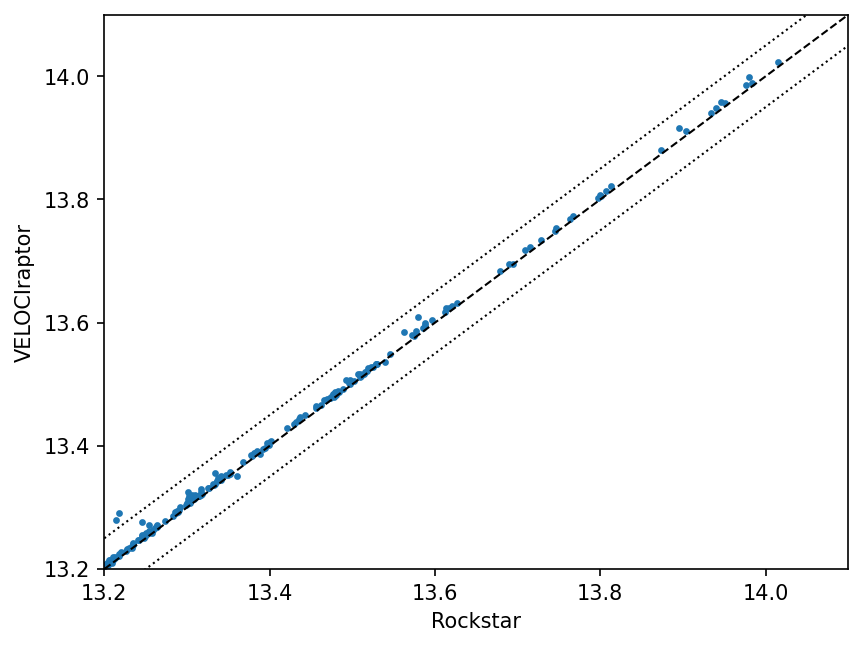

In [54]:
plt.figure(dpi=150)
plt.scatter(np.log10(hal_rs_plot.Mvir), np.log10(hal_vr_plot.Mass_BN98), s=5)
scatrange = (13.2,14.1)
plt.xlim(*scatrange)
plt.ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
plt.plot(scatranx,scatranx,'k--', lw=1)
plt.plot(scatranx,scatranx-0.05,'k:', lw=1)
plt.plot(scatranx,scatranx+0.05,'k:', lw=1)
plt.xlabel('Rockstar')
plt.ylabel('VELOCIraptor')

Text(0, 0.5, 'VELOCIraptor')

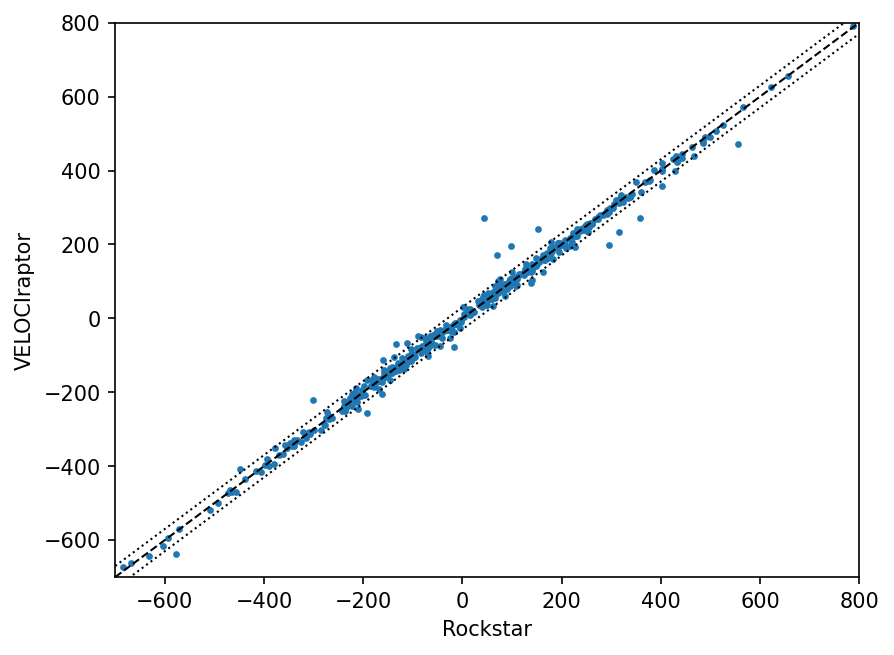

In [97]:
plt.figure(dpi=150)
plt.scatter(hal_rs_plot.VX, hal_vr_plot.VXc, s=5)
scatrange = (-700,800)
plt.xlim(*scatrange)
plt.ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
plt.plot(scatranx,scatranx,'k--', lw=1)
plt.plot(scatranx,scatranx-30,'k:', lw=1)
plt.plot(scatranx,scatranx+30,'k:', lw=1)
plt.xlabel('Rockstar')
plt.ylabel('VELOCIraptor')

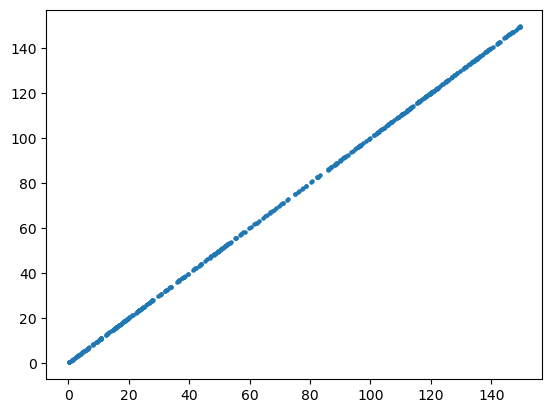

In [98]:
plt.scatter(hal_rs_plot.Z, hal_vr_plot.Zc, s=5)

In [99]:
# 1.5*72(15*2*8/160*72)**2

In [51]:
scale_r = 2

2.6784000000000003

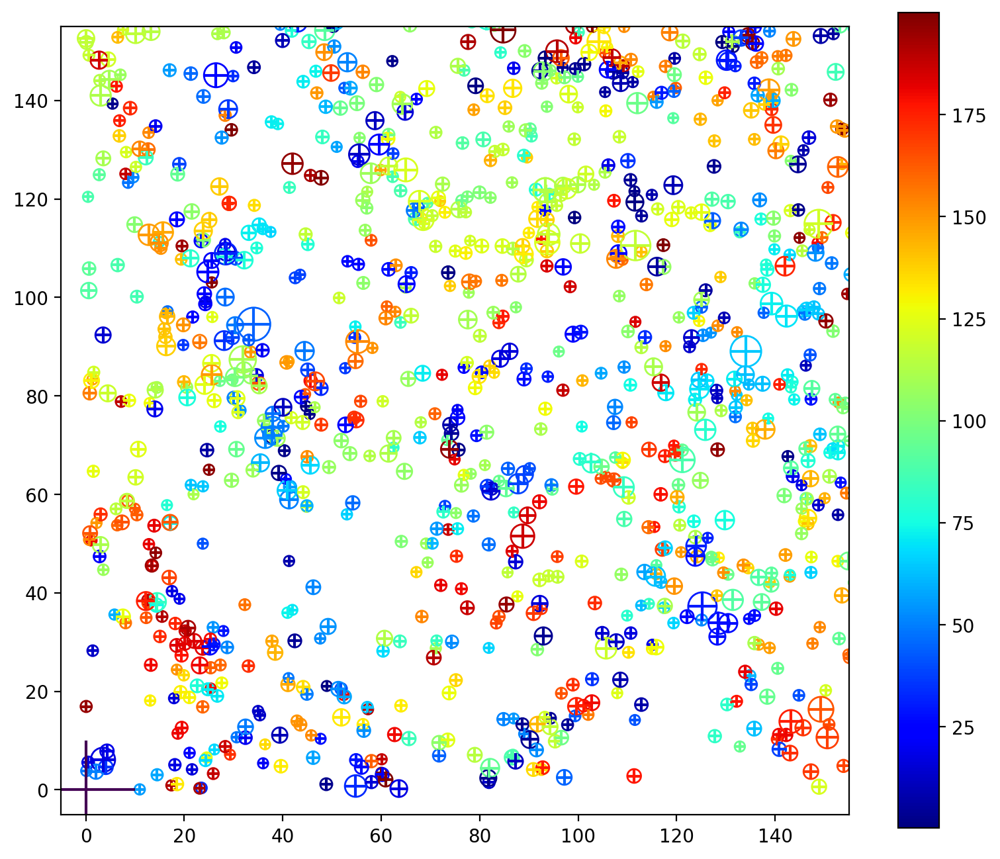

In [52]:
fig, ax1 = plt.subplots(1, dpi=200, figsize=(8*1.2,8))
ax1.set_aspect('equal')
g1 = ax1.scatter(hal_rs_plot.X, hal_rs_plot.Y, c=hal_rs_plot.Z, s=(2.6784*2*scale_r*hal_rs_plot.Rvir)**2/1e6, marker='o', cmap='jet')
g2 = ax1.scatter(hal_vr_plot.Xc, hal_vr_plot.Yc, c=hal_vr_plot.Zc, s=(2.6784*2*scale_r*hal_vr_plot.R_BN98)**2, marker='+', cmap='jet')
g1.set_facecolor('none')
g2.set_facecolor('none')
ax1.set_xlim(-5,155)
ax1.set_ylim(-5,155)
g0 = ax1.scatter(0,0,c=75,s=(2.6784*2*10)**2, marker='+')
g0.set_facecolor('none')
plt.colorbar(g2, ax=ax1)
(ax1.get_window_extent().width  / (160) * 72./fig.dpi)
# print(3*hal_rs_plot.Rvir)

In [53]:
# ax1.get_window_extent().height

2.6784000000000003

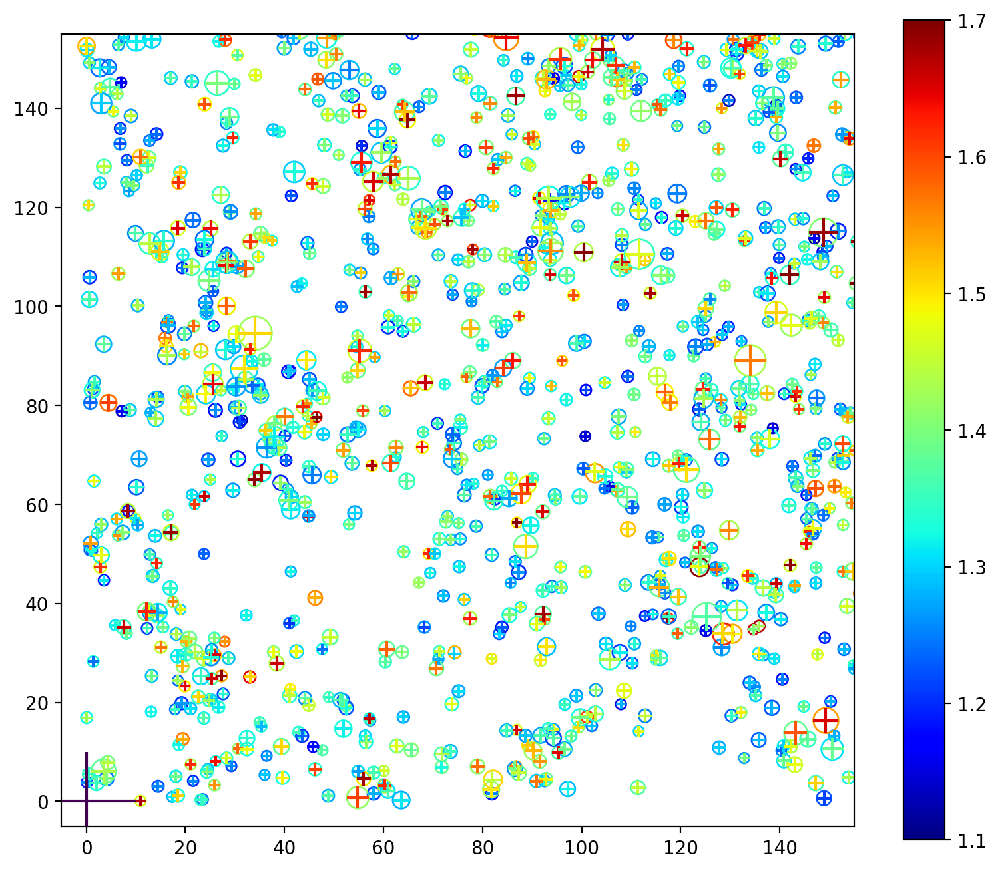

In [54]:
fig, ax1 = plt.subplots(1, dpi=200, figsize=(8*1.2,8))
ax1.set_aspect('equal')
g1 = ax1.scatter(hal_rs_plot.X, hal_rs_plot.Y, c=hal_rs_plot.kin_rat, s=(2.6784*2*scale_r*hal_rs_plot.Rvir)**2/1e6, marker='o', cmap='jet', vmin=1.1,vmax=1.7)
g2 = ax1.scatter(hal_vr_plot.Xc, hal_vr_plot.Yc, c=hal_vr_plot.kin_rat, s=(2.6784*2*scale_r*hal_vr_plot.R_BN98)**2, marker='+', cmap='jet', vmin=1.1,vmax=1.7)
g1.set_facecolor('none')
g2.set_facecolor('none')
ax1.set_xlim(-5,155)
ax1.set_ylim(-5,155)
g0 = ax1.scatter(0,0,c=75,s=(2.6784*2*10)**2, marker='+')
g0.set_facecolor('none')
plt.colorbar(g2, ax=ax1)
(ax1.get_window_extent().width  / (160) * 72./fig.dpi)

In [104]:
# np.array(hal_rs_plot.kin_rat)/np.array(hal_vr_plot.kin_rat)

In [105]:
scale_r = 6

2.6784000000000003

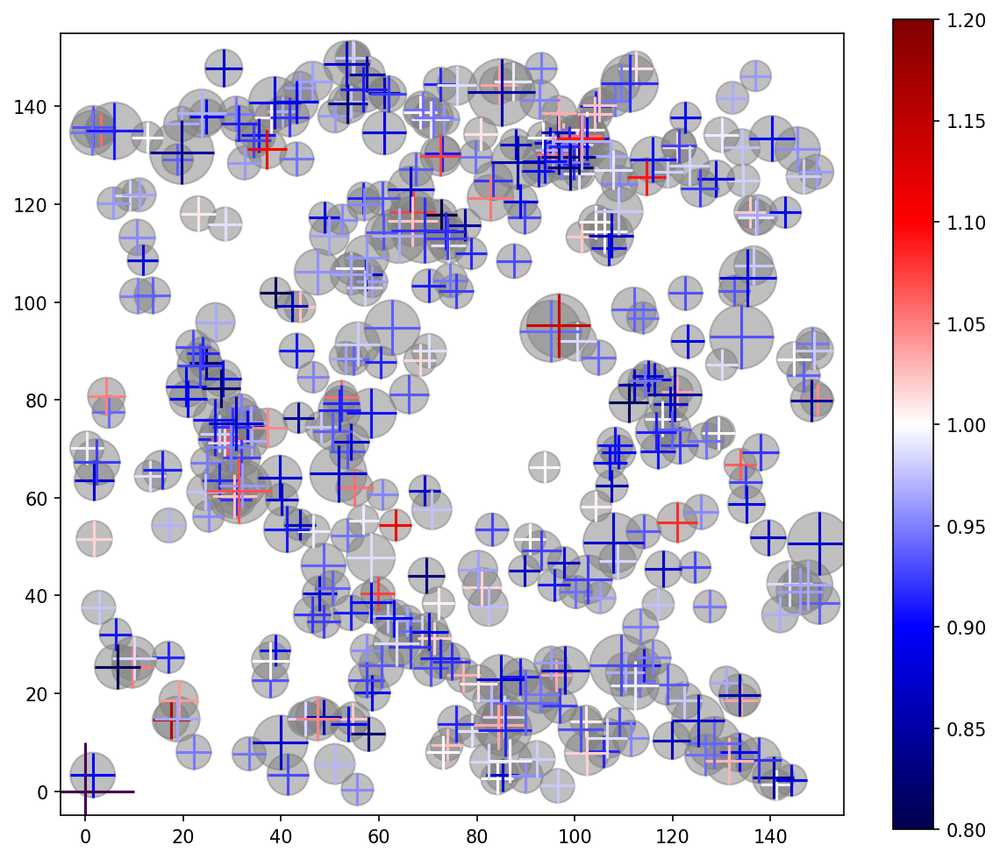

In [106]:
fig, ax1 = plt.subplots(1, dpi=150, figsize=(8*1.2,8))
ax1.set_aspect('equal')
g1 = ax1.scatter(hal_rs_plot.X, hal_rs_plot.Y, c='gray', s=(2.6784*2*scale_r*hal_rs_plot.Rvir)**2/1e6, marker='o', alpha=0.5)
g2 = ax1.scatter(hal_vr_plot.Xc, hal_vr_plot.Yc, c=np.array(hal_rs_plot.kin_rat)/np.array(hal_vr_plot.kin_rat), s=(2.6784*2*scale_r*hal_vr_plot.R_BN98)**2, marker='+', cmap='seismic', vmin=0.8,vmax=1.2)
# g1.set_facecolor('none')
g2.set_facecolor('none')
ax1.set_xlim(-5,155)
ax1.set_ylim(-5,155)
g0 = ax1.scatter(0,0,c=75,s=(2.6784*2*10)**2, marker='+')
g0.set_facecolor('none')
plt.colorbar(g2, ax=ax1)
(ax1.get_window_extent().width  / (160) * 72./fig.dpi)

In [107]:
# hal_vr_all

In [55]:
hal_vr_all.shape, hal_rs_all.shape

((1382892, 154), (1700443, 42))

In [ ]:
t_now = time()
match_idx_all = cross_match(hal_vr_all, hal_rs_all, match_vel=True)
print(match_idx_all.shape)
t_bef, t_now = t_now, time()
print(t_now-t_bef)

In [45]:
(145591, 2)
2058.1233174800873

2058.1233174800873

In [ ]:
match_idx_all.to_hdf(f"/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18/{rund:s}/halos_vr_6d/out_{i:03d}.crossmatch", key='idx')

In [32]:
match_idx_all = pd.read_hdf(f"/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18/{rund:s}/halos_vr_6d/out_{i:03d}.crossmatch", key='idx')

In [33]:
match_idx_all

,vr,rs
0,2,105
1,3,172
2,4,141
3,6,416
4,7,9251
...,...,...
145586,192332,271344
145587,192333,268339
145588,192334,275865
145589,192335,272049


In [34]:
# match_idx_all.set_index('vr')

In [35]:
# hal_vr_matched_all.reset_index()

In [36]:
hal_vr_matched_all = hal_vr_all.loc[match_idx_all['vr']]
hal_rs_matched_all = hal_rs_all.loc[match_idx_all['rs']]

In [48]:
match_idx_all_spl = match_idx_all.sample(500, random_state=20)
hal_vr_matched = hal_vr_all.loc[match_idx_all_spl['vr']]
hal_rs_matched = hal_rs_all.loc[match_idx_all_spl['rs']]

In [42]:
hal_vr_plot = hal_vr_matched
hal_rs_plot = hal_rs_matched

Text(0, 0.5, 'VELOCIraptor')

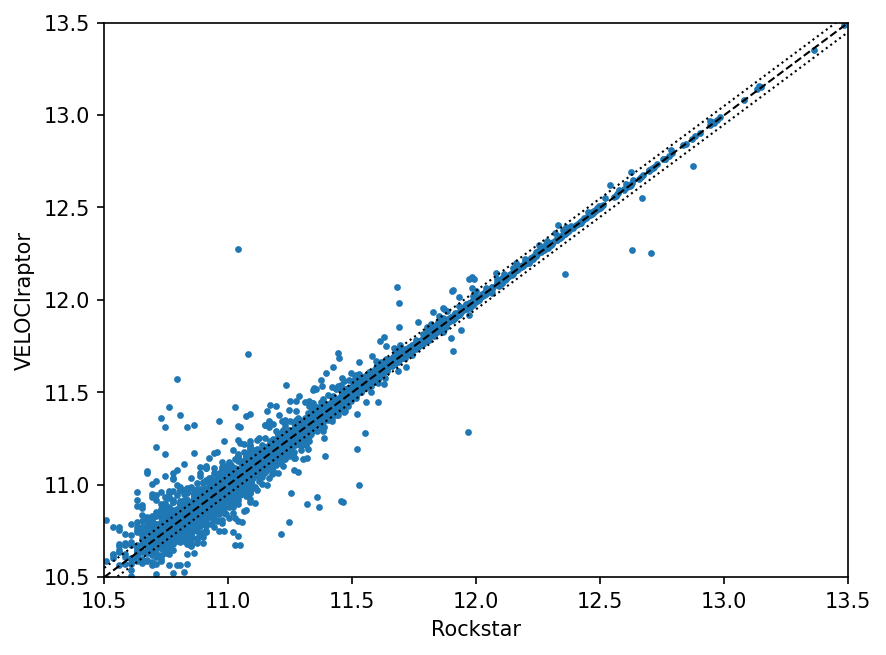

In [43]:
plt.figure(dpi=150)
plt.scatter(np.log10(hal_rs_plot.Mvir), np.log10(hal_vr_plot.Mass_BN98), s=5)
scatrange = (10.5,13.5)
plt.xlim(*scatrange)
plt.ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
plt.plot(scatranx,scatranx,'k--', lw=1)
plt.plot(scatranx,scatranx-0.05,'k:', lw=1)
plt.plot(scatranx,scatranx+0.05,'k:', lw=1)
plt.xlabel('Rockstar')
plt.ylabel('VELOCIraptor')

Text(0, 0.5, 'VELOCIraptor')

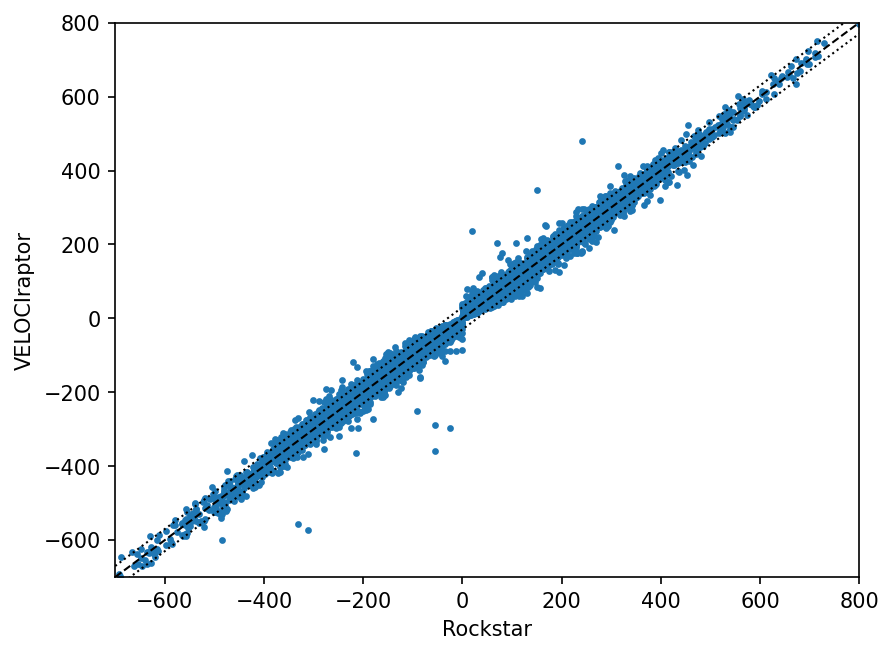

In [118]:
plt.figure(dpi=150)
plt.scatter(hal_rs_plot.VX, hal_vr_plot.VXc, s=5)
scatrange = (-700,800)
plt.xlim(*scatrange)
plt.ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
plt.plot(scatranx,scatranx,'k--', lw=1)
plt.plot(scatranx,scatranx-30,'k:', lw=1)
plt.plot(scatranx,scatranx+30,'k:', lw=1)
plt.xlabel('Rockstar')
plt.ylabel('VELOCIraptor')

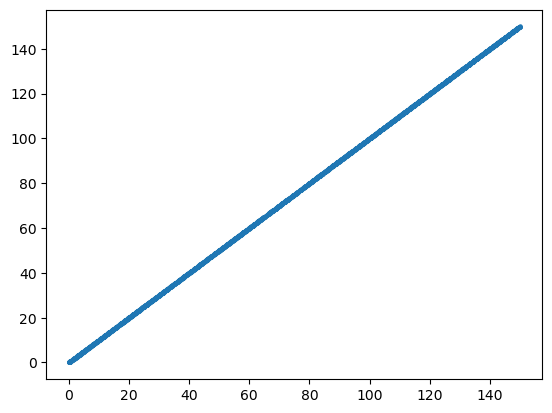

In [119]:
plt.scatter(hal_rs_plot.Z, hal_vr_plot.Zc, s=5)

In [120]:
# 1.5*72(15*2*8/160*72)**2

In [121]:
scale_r = 6

4.0176

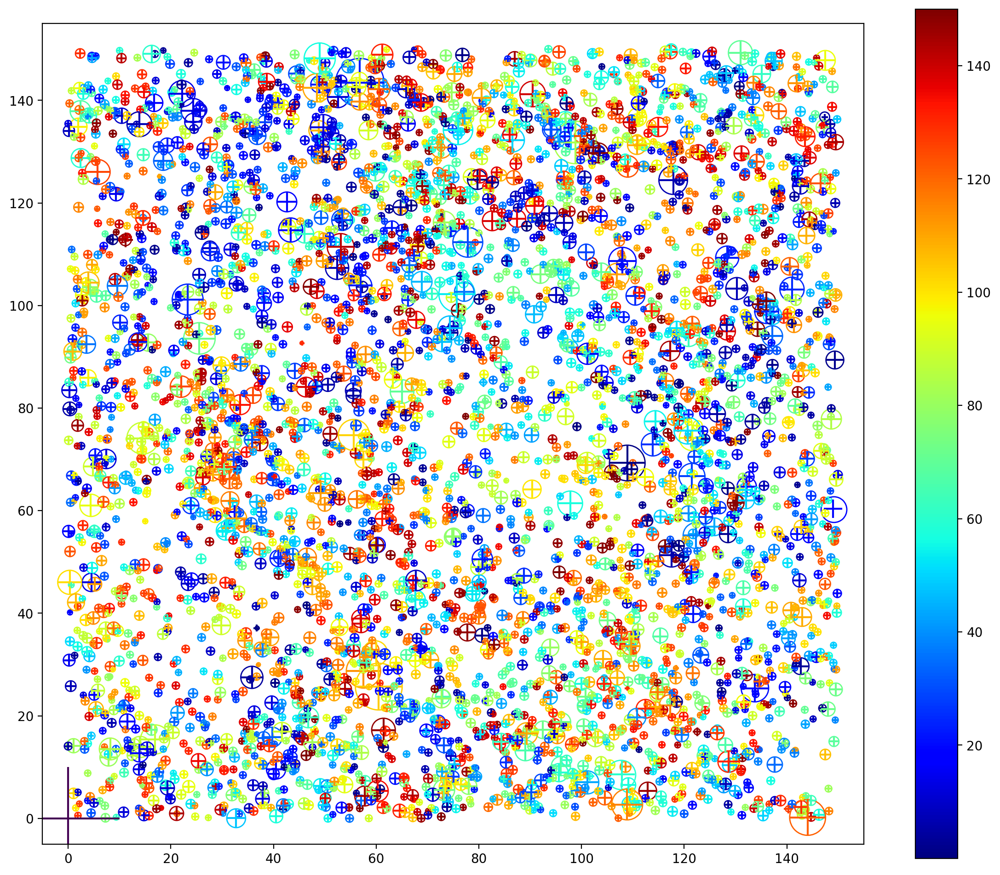

In [122]:
fig, ax1 = plt.subplots(1, dpi=200, figsize=(12*1.2,12))
ax1.set_aspect('equal')
g1 = ax1.scatter(hal_rs_plot.X, hal_rs_plot.Y, c=hal_rs_plot.Z, s=(4.0176*2*scale_r*hal_rs_plot.Rvir)**2/1e6, marker='o', cmap='jet')
g2 = ax1.scatter(hal_vr_plot.Xc, hal_vr_plot.Yc, c=hal_vr_plot.Zc, s=(4.0176*2*scale_r*hal_vr_plot.R_BN98)**2, marker='+', cmap='jet')
g1.set_facecolor('none')
g2.set_facecolor('none')
ax1.set_xlim(-5,155)
ax1.set_ylim(-5,155)
g0 = ax1.scatter(0,0,c=75,s=(4.0176*2*10)**2, marker='+')
g0.set_facecolor('none')
plt.colorbar(g2, ax=ax1)
(ax1.get_window_extent().width  / (160) * 72./fig.dpi)
# print(3*hal_rs_plot.Rvir)

In [123]:
# ax1.get_window_extent().height

4.0176

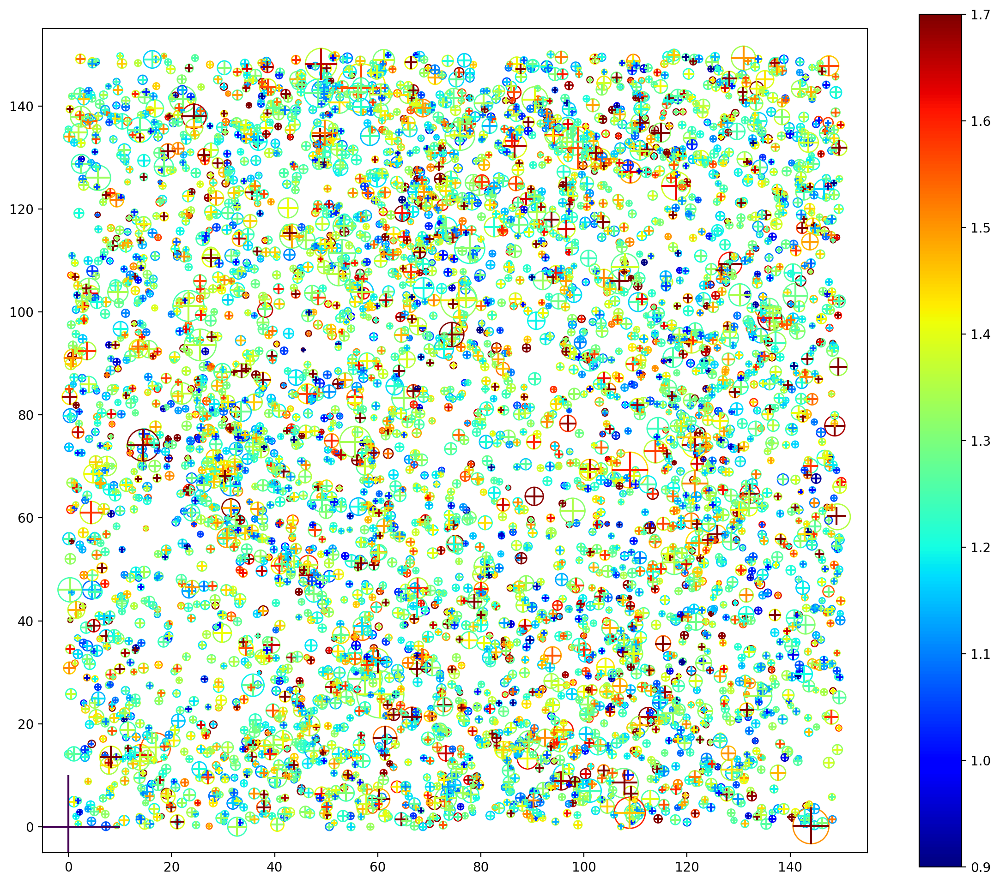

In [124]:
fig, ax1 = plt.subplots(1, dpi=200, figsize=(12*1.2,12))
ax1.set_aspect('equal')
g1 = ax1.scatter(hal_rs_plot.X, hal_rs_plot.Y, c=hal_rs_plot.kin_rat, s=(4.0176*2*scale_r*hal_rs_plot.Rvir)**2/1e6, marker='o', cmap='jet', vmin=0.9,vmax=1.7)
g2 = ax1.scatter(hal_vr_plot.Xc, hal_vr_plot.Yc, c=hal_vr_plot.kin_rat, s=(4.0176*2*scale_r*hal_vr_plot.R_BN98)**2, marker='+', cmap='jet', vmin=0.9,vmax=1.7)
g1.set_facecolor('none')
g2.set_facecolor('none')
ax1.set_xlim(-5,155)
ax1.set_ylim(-5,155)
g0 = ax1.scatter(0,0,c=75,s=(4.0176*2*10)**2, marker='+')
g0.set_facecolor('none')
plt.colorbar(g2, ax=ax1)
(ax1.get_window_extent().width  / (160) * 72./fig.dpi)

Text(0.5, 0, 'RS')

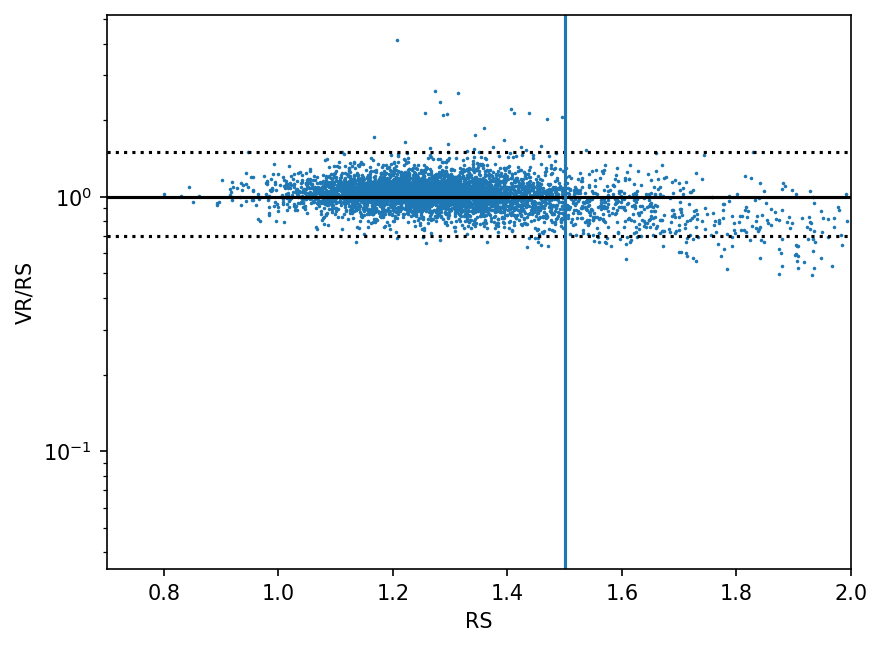

In [125]:
plt.figure(dpi=150)
plt.scatter( hal_rs_plot.kin_rat,np.array(hal_vr_plot.kin_rat)/np.array(hal_rs_plot.kin_rat), s=0.5)
scatrange = (0.7,2)
plt.xlim(*scatrange)
# plt.ylim(*scatrange)
plt.yscale('log')
scatranx = np.linspace(*scatrange,10)
# scatrange = 
# plt.plot(scatranx,scatranx,'k--', lw=1)
# plt.plot(scatranx,scatranx-0.1,'k:', lw=1)
# plt.plot(scatranx,scatranx+0.1,'k:', lw=1)
plt.axhline(1, c='k', ls = '-')
plt.axhline(0.7, c='k', ls=':')
plt.axhline(1.5, c='k', ls=':')
plt.axvline(1.5)
plt.ylabel('VR/RS')
plt.xlabel('RS')

Text(0, 0.5, 'VELOCIraptor')

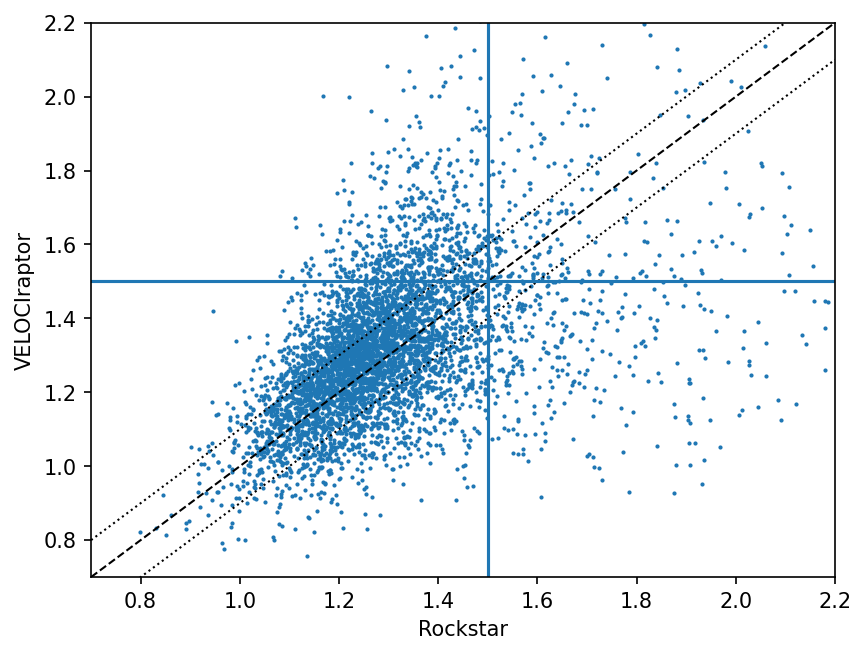

In [126]:
plt.figure(dpi=150)
plt.scatter(hal_rs_plot.kin_rat, hal_vr_plot.kin_rat, s=1)
scatrange = (0.7,2.2)
plt.xlim(*scatrange)
plt.ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
plt.plot(scatranx,scatranx,'k--', lw=1)
plt.plot(scatranx,scatranx-0.1,'k:', lw=1)
plt.plot(scatranx,scatranx+0.1,'k:', lw=1)
plt.axvline(1.5)
plt.axhline(1.5)
plt.xlabel('Rockstar')
plt.ylabel('VELOCIraptor')

In [37]:
hal_vr_plot = hal_vr_matched_all
hal_rs_plot = hal_rs_matched_all

In [54]:
# cond = np.where(hal_vr_plot.Mass_BN98>1e13)
# hal_vr_plot = hal_vr_plot.iloc[cond]
# hal_rs_plot = hal_rs_plot.iloc[cond]

In [55]:
hal_vr_plot.Mass_BN98

ID
2         2.027323e+13
3         1.862676e+13
4         1.628414e+13
6         1.320833e+13
7         9.483489e+12
              ...     
192332    5.297329e+10
192333    4.201623e+10
192334    5.775368e+10
192335    5.534961e+10
192336    5.687688e+10
Name: Mass_BN98, Length: 145591, dtype: float64

In [50]:
# pd.cut(hal_rs_plot.Mvir, bins=100)

In [51]:
# hal_vr_plot

In [52]:
%matplotlib widget

In [145]:
%matplotlib inline

In [146]:
# hal_rs_plot.sort_values('Mvir', inplace=True)

In [147]:
# hal_vr_plot.sort_values('Mass_BN98', inplace=True)

In [56]:
hal_rs_plot_grpd = hal_rs_plot.groupby(pd.cut(hal_rs_plot.Mvir, bins=np.logspace(11,14.5,50)))

In [57]:
hal_vr_plot_grpd = hal_vr_plot.groupby(pd.cut(hal_vr_plot.Mass_BN98, bins=np.logspace(11,14.5,50)))

Text(0, 0.5, 'VELOCIraptor')

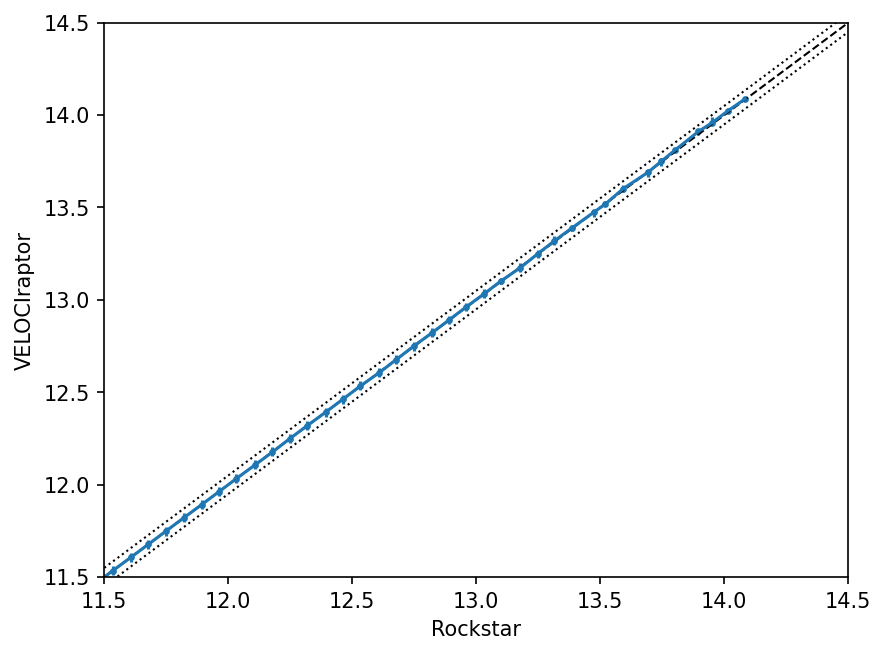

In [58]:
plt.figure(dpi=150)
plt.scatter(np.log10(hal_rs_plot_grpd.Mvir.median()), np.log10(hal_vr_plot_grpd.Mass_BN98.median()), s=5)
plt.errorbar(np.log10(hal_rs_plot_grpd.Mvir.median()), np.log10(hal_vr_plot_grpd.Mass_BN98.median()), yerr= [np.log10(hal_vr_plot_grpd.Mass_BN98.median())-np.log10(hal_vr_plot_grpd.Mass_BN98.quantile(.16)), np.log10(hal_vr_plot_grpd.Mass_BN98.quantile(.84))-np.log10(hal_vr_plot_grpd.Mass_BN98.median())])
# plt.scatter(np.log10(hal_rs_plot_grpd.Mvir.median()), np.log10(hal_vr_plot_grpd.Mass_BN98.quantile(.16)), s=5)
# plt.scatter(np.log10(hal_rs_plot_grpd.Mvir.median()), np.log10(hal_vr_plot_grpd.Mass_BN98.quantile(.84)), s=5)
scatrange = (11.5,14.5)
plt.xlim(*scatrange)
plt.ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
plt.plot(scatranx,scatranx,'k--', lw=1)
plt.plot(scatranx,scatranx-0.05,'k:', lw=1)
plt.plot(scatranx,scatranx+0.05,'k:', lw=1)
plt.xlabel('Rockstar')
plt.ylabel('VELOCIraptor')

In [59]:
hal_plot_mass = pd.concat([hal_rs_plot.reset_index().Mvir,hal_vr_plot.reset_index().Mass_BN98], axis=1, keys=['rs','vr'])

In [60]:
hal_plot_mass_grpd = hal_plot_mass.groupby(pd.cut(hal_plot_mass.rs, bins=np.logspace(11,14.5,300)))

In [61]:
hal_plot_mass_grpd_median = hal_plot_mass_grpd.median()
hal_plot_mass_grpd_1sig_l = hal_plot_mass_grpd.quantile(.16)
hal_plot_mass_grpd_1sig_r = hal_plot_mass_grpd.quantile(.84)

Text(0, 0.5, 'VELOCIraptor')

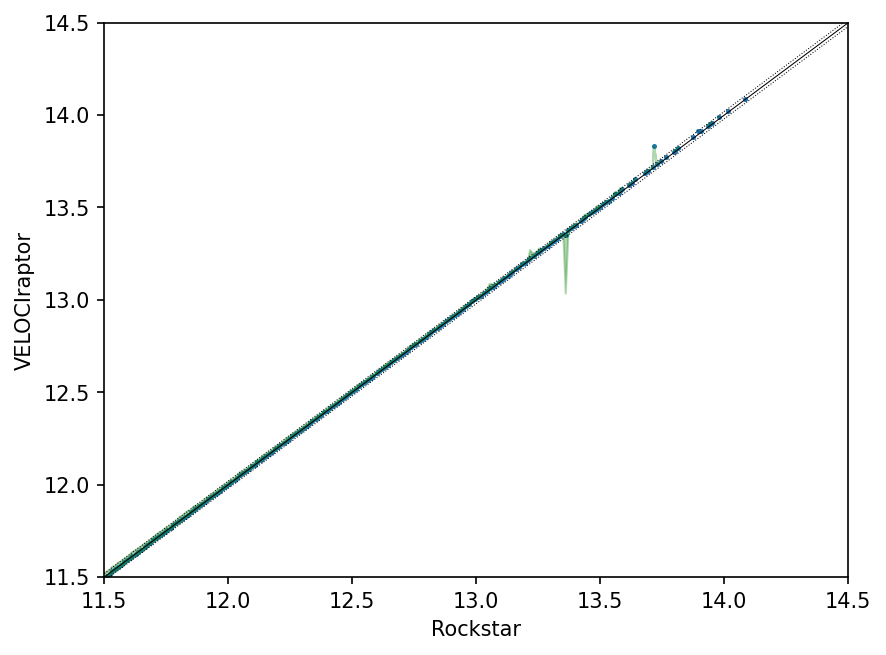

In [62]:
plt.figure(dpi=150)
plt.scatter(np.log10(hal_plot_mass_grpd_median.rs), np.log10(hal_plot_mass_grpd_median.vr), s=2)
# plt.errorbar(np.log10(hal_plot_mass_grpd_median.rs), np.log10(hal_plot_mass_grpd_median.vr), yerr= [np.log10(hal_plot_mass_grpd_median.vr)-np.log10(hal_plot_mass_grpd_1sig_l.vr), np.log10(hal_plot_mass_grpd_1sig_r.vr)-np.log10(hal_plot_mass_grpd_median.vr)])
plt.fill_between(np.log10(hal_plot_mass_grpd_median.rs), np.log10(hal_plot_mass_grpd_1sig_l.vr), np.log10(hal_plot_mass_grpd_1sig_r.vr), color='green', alpha=.3)
scatrange = (11.5,14.5)
plt.xlim(*scatrange)
plt.ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
plt.plot(scatranx,scatranx,'k-', lw=.5)
plt.plot(scatranx,scatranx-0.02,'k:', lw=.5)
plt.plot(scatranx,scatranx+0.02,'k:', lw=.5)
plt.xlabel('Rockstar')
plt.ylabel('VELOCIraptor')

Text(0, 0.5, 'VELOCIraptor-Rockstar')

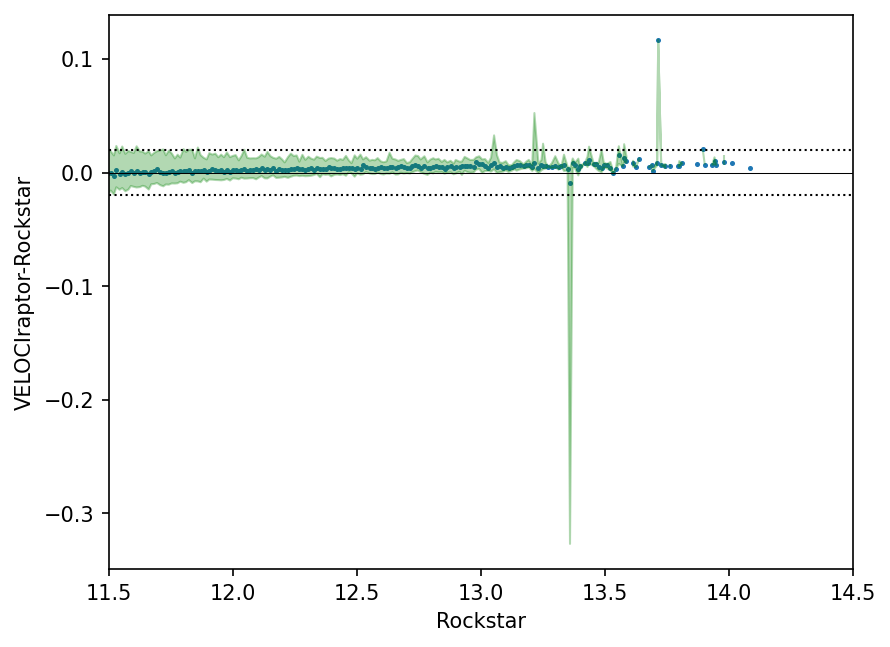

In [63]:
plt.figure(dpi=150)
plt.scatter(np.log10(hal_plot_mass_grpd_median.rs), np.log10(hal_plot_mass_grpd_median.vr)-np.log10(hal_plot_mass_grpd_median.rs), s=2)
# plt.errorbar(np.log10(hal_plot_mass_grpd_median.rs), np.log10(hal_plot_mass_grpd_median.vr), yerr= [np.log10(hal_plot_mass_grpd_median.vr)-np.log10(hal_plot_mass_grpd_1sig_l.vr), np.log10(hal_plot_mass_grpd_1sig_r.vr)-np.log10(hal_plot_mass_grpd_median.vr)])
plt.fill_between(np.log10(hal_plot_mass_grpd_median.rs), np.log10(hal_plot_mass_grpd_1sig_l.vr)-np.log10(hal_plot_mass_grpd_median.rs), np.log10(hal_plot_mass_grpd_1sig_r.vr)-np.log10(hal_plot_mass_grpd_median.rs), color='green', alpha=.3)
# plt.scatter(np.log10(hal_rs_matched_all_grpd.rs.median()), np.log10(hal_vr_matched_all_grpd.vr.quantile(.16)), s=5)
# plt.scatter(np.log10(hal_rs_matched_all_grpd.rs.median()), np.log10(hal_vr_matched_all_grpd.vr.quantile(.84)), s=5)
scatrange = (11.5,14.5)
plt.xlim(*scatrange)
# plt.ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
plt.plot(scatranx,scatranx*0,'k-', lw=.5)
plt.plot(scatranx,scatranx*0-0.02,'k:', lw=1)
plt.plot(scatranx,scatranx*0+0.02,'k:', lw=1)
plt.xlabel('Rockstar')
plt.ylabel('VELOCIraptor-Rockstar')

In [48]:
y1 = np.exp(np.random.normal(size=100000,loc=0.25,scale=.19))

In [49]:
# plt.hist(y1, range=[0,3],bins=50)
# plt.show()

In [50]:
err = np.random.normal(size=100000,loc=0,scale=0.3+0.1*y1)
y2 = y1 + err

In [51]:
smpldf = pd.DataFrame(np.vstack([y1,y2]).T,columns=['rs','vr'])

In [52]:
hal_plot_eta = pd.concat([hal_rs_plot.reset_index().kin_rat,hal_vr_plot.reset_index().kin_rat], axis=1, keys=['rs','vr'])

In [53]:
hal_plot_eta_grpd = hal_plot_eta.groupby(pd.cut(hal_plot_eta.rs, bins=np.linspace(0.5,3,50)))

In [54]:
hal_plot_eta_grpd_median = hal_plot_eta_grpd.median()
hal_plot_eta_grpd_1sig_l = hal_plot_eta_grpd.quantile(.16)
hal_plot_eta_grpd_1sig_r = hal_plot_eta_grpd.quantile(.84)

In [55]:
# hal_plot_eta_grpd_median

In [56]:
# hal_plot_eta_grpd.size()

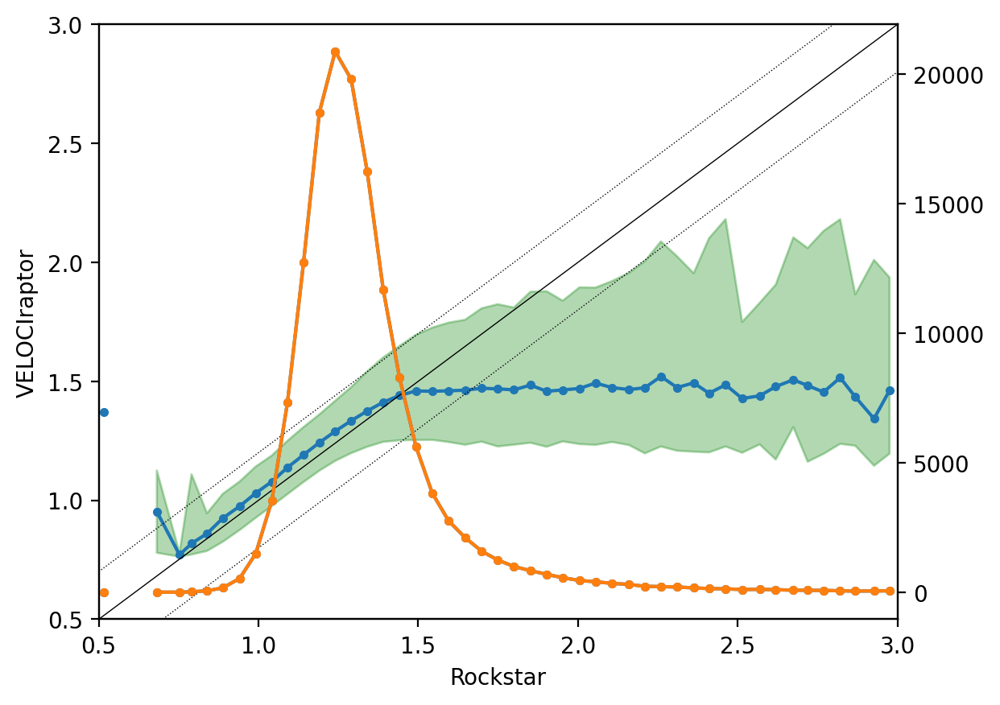

In [58]:
fig1, ax1 = plt.subplots(1, dpi=200)
ax1.plot((hal_plot_eta_grpd_median.rs), (hal_plot_eta_grpd_median.vr), marker='o', markersize=3)
# plt.errorbar((hal_plot_mass_grpd_median.rs), (hal_plot_mass_grpd_median.vr), yerr= [(hal_plot_mass_grpd_median.vr)-(hal_plot_mass_grpd_1sig_l.vr), (hal_plot_mass_grpd_1sig_r.vr)-(hal_plot_mass_grpd_median.vr)])
ax1.fill_between((hal_plot_eta_grpd_median.rs), (hal_plot_eta_grpd_1sig_l.vr), (hal_plot_eta_grpd_1sig_r.vr), color='green', alpha=.3)
scatrange = (.5,3)
ax1.set_xlim(*scatrange)
ax1.set_ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
ax1.plot(scatranx,scatranx,'k-', lw=.5)
ax1.plot(scatranx,scatranx-0.2,'k:', lw=.5)
ax1.plot(scatranx,scatranx+0.2,'k:', lw=.5)
ax1.set_xlabel('Rockstar')
ax1.set_ylabel('VELOCIraptor')
ax2 = ax1.twinx()
ax2.plot((hal_plot_eta_grpd_median.rs), (hal_plot_eta_grpd.count()), marker='o', markersize=3)
# ax2.hist(y1, range=[0,3],bins=100, weights=4.5*np.ones(y1.shape[0]))
plt.savefig(f'kinrat-plot.pdf')

In [59]:
hal_plot_eta_grpd = hal_plot_eta.groupby(pd.cut(hal_plot_eta.vr, bins=np.linspace(0.5,3,50)))

In [60]:
hal_plot_eta_grpd_median = hal_plot_eta_grpd.median()
hal_plot_eta_grpd_1sig_l = hal_plot_eta_grpd.quantile(.16)
hal_plot_eta_grpd_1sig_r = hal_plot_eta_grpd.quantile(.84)

In [61]:
# hal_plot_eta_grpd_median

In [62]:
# hal_plot_eta_grpd.size()

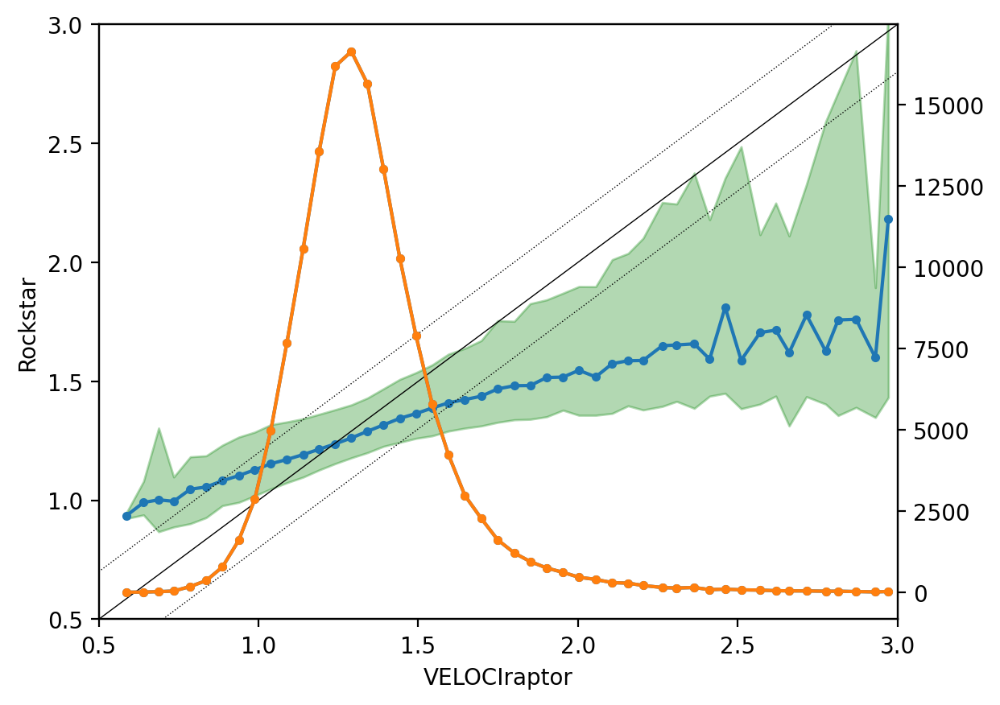

In [63]:
fig1, ax1 = plt.subplots(1, dpi=200)
ax1.plot((hal_plot_eta_grpd_median.vr), (hal_plot_eta_grpd_median.rs), marker='o', markersize=3)
# plt.errorbar((hal_plot_mass_grpd_median.vr), (hal_plot_mass_grpd_median.rs), yerr= [(hal_plot_mass_grpd_median.rs)-(hal_plot_mass_grpd_1sig_l.rs), (hal_plot_mass_grpd_1sig_r.rs)-(hal_plot_mass_grpd_median.rs)])
ax1.fill_between((hal_plot_eta_grpd_median.vr), (hal_plot_eta_grpd_1sig_l.rs), (hal_plot_eta_grpd_1sig_r.rs), color='green', alpha=.3)
scatrange = (.5,3)
ax1.set_xlim(*scatrange)
ax1.set_ylim(*scatrange)
scatranx = np.linspace(*scatrange,10)
ax1.plot(scatranx,scatranx,'k-', lw=.5)
ax1.plot(scatranx,scatranx-0.2,'k:', lw=.5)
ax1.plot(scatranx,scatranx+0.2,'k:', lw=.5)
ax1.set_ylabel('Rockstar')
ax1.set_xlabel('VELOCIraptor')
ax2 = ax1.twinx()
ax2.plot((hal_plot_eta_grpd_median.vr), (hal_plot_eta_grpd.count()), marker='o', markersize=3)
plt.savefig(f'kinrat-plot.pdf')

In [64]:
snap = Snapshot(f"/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18/r1/snaps/snapdir_{i:03d}/snapshot_{i:03d}.0")

In [65]:
posd = read_positions_all_files(f"/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18/r1/snaps/snapdir_{i:03d}/snapshot_{i:03d}", prtcl_type='Halo', downsample=8)

/scratch/cprem/sims/L150_N512_Cp18/r1/snaps/snapdir_010/snapshot_010.0.hdf5 True
Instantiated a snapshot object, use 'from_binary' method to read from binary.
/scratch/cprem/sims/L150_N512_Cp18/r1/snaps/snapdir_010/snapshot_010.1.hdf5 True
Instantiated a snapshot object, use 'from_binary' method to read from binary.
/scratch/cprem/sims/L150_N512_Cp18/r1/snaps/snapdir_010/snapshot_010.2.hdf5 True
Instantiated a snapshot object, use 'from_binary' method to read from binary.
/scratch/cprem/sims/L150_N512_Cp18/r1/snaps/snapdir_010/snapshot_010.3.hdf5 True
Instantiated a snapshot object, use 'from_binary' method to read from binary.
/scratch/cprem/sims/L150_N512_Cp18/r1/snaps/snapdir_010/snapshot_010.4.hdf5 True
Instantiated a snapshot object, use 'from_binary' method to read from binary.
/scratch/cprem/sims/L150_N512_Cp18/r1/snaps/snapdir_010/snapshot_010.5.hdf5 True
Instantiated a snapshot object, use 'from_binary' method to read from binary.
/scratch/cprem/sims/L150_N512_Cp18/r1/snaps/sn

In [66]:
deltad = assign_density(posd, L, scheme='CIC')#, overdensity=False)

In [67]:
# deltab = assign_density(posb, L, scheme='NGP')

In [132]:
deltad_slice = deltad[:,:,250:260].mean(axis=2)

In [ ]:
deltad_slice = deltad[:256]

In [69]:
# deltab_slice = deltab[100:150].mean(axis=0)

In [70]:
# deltad_slice

In [71]:
# vmin=5e-2,vmax=5e2

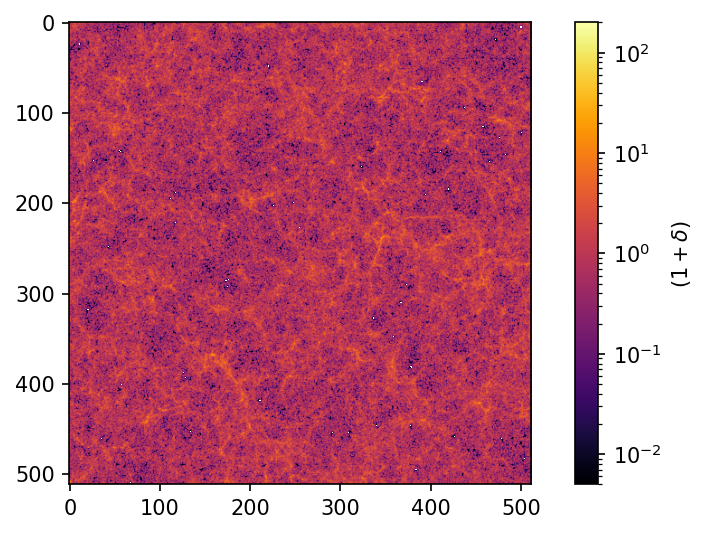

In [72]:
fig1, ax1 = plt.subplots(1,1, figsize=(7.5,4), dpi=150)
im1 = ax1.imshow(deltad_slice+1, norm=LogNorm(vmin=5e-3,vmax=2e2), cmap='inferno')
cb1 = fig1.colorbar(im1,ax=ax1)
cb1.set_label(r"$(1+\delta)$")

In [73]:
# match_idx_all_spl = match_idx_all.sample(100000, random_state=20)
hal_vr_matched = hal_vr_all.loc[match_idx_all['vr']]
# hal_rs_matched = hal_rs_all.loc[match_idx_all_spl['rs']]

In [74]:
hal_vr_plot = hal_vr_matched
# hal_rs_plot = hal_rs_matched

In [75]:
hal_vr_plot = hal_vr_plot.loc[hal_vr_plot.Zc.between(73.24,76.17)]
hal_vr_plot = hal_vr_plot.loc[hal_vr_plot.Mass_BN98.between(2e12,1e15)]

In [76]:
scale_r = 4

In [77]:
# hal_vr_plot.Mass_BN98/(4*np.pi/3*hal_vr_plot.R_BN98**3)/mean_dens_comov#/(4*np.pi/3*hal_vr_plot.R_BN98**3)/mean_dens_comov

3.2140799999999996

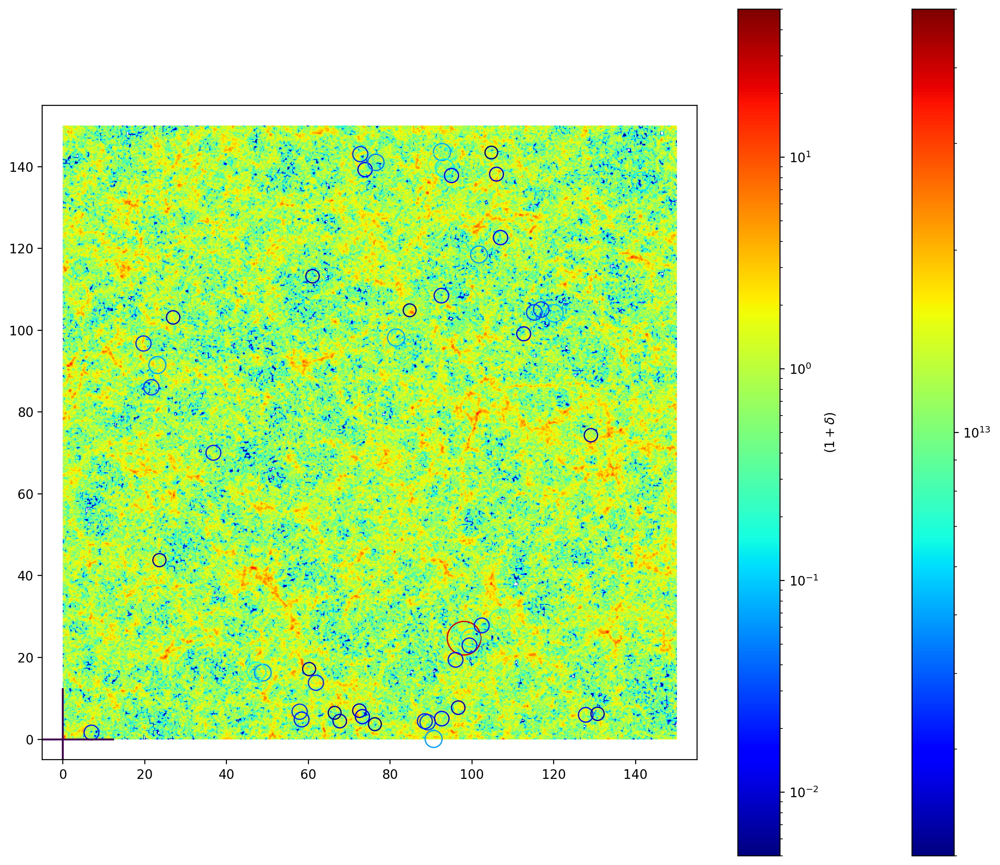

In [79]:
fig, ax1 = plt.subplots(1, dpi=200, figsize=(12*1.2,12))
ax1.set_aspect('equal')
# g1 = ax1.scatter(hal_rs_plot.X, hal_rs_plot.Y, c=hal_rs_plot.Z, s=(4.0176*2*scale_r*hal_rs_plot.Rvir)**2/1e6, marker='o', cmap='jet')
g2 = ax1.scatter(hal_vr_plot.Xc, hal_vr_plot.Yc, c=hal_vr_plot.Mass_BN98, norm=LogNorm(vmin=2e12,vmax=5e13), s=(4.0176*2*scale_r*hal_vr_plot.R_BN98)**2, marker='o', cmap='jet')
# g1.set_facecolor('none')
g2.set_facecolor('none')
ax1.set_xlim(-5,155)
ax1.set_ylim(-5,155)
g0 = ax1.scatter(0,0,c=75,s=(4.0176*2*10)**2, marker='+')
g0.set_facecolor('none')
fig.colorbar(g2, ax=ax1)
im1 = ax1.imshow(deltad_slice+1, norm=LogNorm(vmin=5e-3,vmax=5e1), origin='upper', cmap='jet', extent=(0,150,0,150))
cb2 = fig.colorbar(im1,ax=ax1)
cb2.set_label(r"$(1+\delta)$")
(ax1.get_window_extent().width  / (160) * 72./fig.dpi)
# print(3*hal_rs_plot.Rvir)

In [ ]:
(ax1.get_window_extent().width  / (160) * 72./fig.dpi) ** 2

In [ ]:
ax1.get_window_extent().height